In [3]:
import pandas as pd
file_path1 = 'data/프로젝트 데이터_API/상해_목록2.csv' 
file_path2 = 'data/프로젝트 데이터_API/상해_본문2.csv'

# 2. 여러 파일 불러와서 하나의 데이터프레임으로 좌우로 합치기
df1 = pd.read_csv(file_path1)
df2 = pd.read_csv(file_path2)

# 3. 데이터프레임 좌우 병합
df = pd.concat([df1,df2], axis=1)

# 4. 데이터 확인
print(df.head())  # 데이터의 처음 5행을 확인합니다.

# 5. 빈도수 분석 (좌우 병합의 경우 분석할 열을 정확히 지정해야 함)
column_names = {
    '사건명': 'Case_Name',
    '법원명': 'Court_Name',
    '사건종류명': 'Case_Type',
    '선고': 'Verdict',
    '판결유형': 'Judge_Type',
    '판시사항': 'Issue',
    '판결요지': 'Summary',
    '참조조문': 'Refer_Article',
    '참조판례': 'Refer_Precedent',
    '판례내용': 'Content'
}
frequency_results = {}

for column in column_names.keys():
    print(f"\n컬럼명: {column}")
    frequency_counts = df[column].value_counts(dropna=False)  # NaN 값 포함하여 빈도수 계산
    print(frequency_counts)
    
    # 영어 열 이름에 빈도수를 저장
    english_column_name = column_names[column]
    frequency_results[english_column_name] = frequency_counts

# 빈도수 결과 확인
for key, value in frequency_results.items():
    print(f"\n{key}의 빈도수:\n{value}")

   판례일련번호                                                사건명        사건번호  \
0  241209  법인세등부과처분취소[국내사업장을 가진 외국법인이 국내 및 국외에 걸쳐 선박에 의한 ...  2022두51031   
1  240925  폭행·특수상해(인정된죄명:상해)·특수협박(인정된죄명:협박)·감금[피고인이 위험한 물...  2023도18812   
2  240809  상해[형사소송법 제33조 제1항 제1호가 정한 필요적 국선변호인 선정사유인 ‘구속’...   2021도6357   
3  239933                                     상해(인정된죄명:강간상해)  2023도11371   
4  241179                                    강도상해·감금·폭행·강요미수  2023도12851   

         선고일자  법원명 사건종류명                                             판례상세링크  \
0  2024.07.25  대법원    세무  /DRF/lawService.do?OC=wanja1996&target=prec&ID...   
1  2024.06.13  대법원    형사  /DRF/lawService.do?OC=wanja1996&target=prec&ID...   
2  2024.05.23  대법원    형사  /DRF/lawService.do?OC=wanja1996&target=prec&ID...   
3  2024.03.12  대법원    형사  /DRF/lawService.do?OC=wanja1996&target=prec&ID...   
4  2024.02.08  대법원    형사  /DRF/lawService.do?OC=wanja1996&target=prec&ID...   

   판례정보일련번호        사건번호  선고      판결유형  \
0    241209  2022두51031  선고

In [4]:
frequency_results.keys()

dict_keys(['Case_Name', 'Court_Name', 'Case_Type', 'Verdict', 'Judge_Type', 'Issue', 'Summary', 'Refer_Article', 'Refer_Precedent', 'Content'])

In [5]:
frequency_results['Issue']

판시사항
NaN                                                                                                                                                                                                                                                                                                                         772
\n                                                                                                                                                                                                                                                                                                                            3
 유죄로 인정하기 위한 증거의 증명력 정도<br/>                                                                                                                                                                                                                                                                                                  3
범행당시 심신미약의 상태에 있었다고 인정되는 사례<br/>   

In [6]:
issue=df['판시사항'].to_list()
issue[0]
mod_issue = [f"[CLS] {sentence} [SEP]" for sentence in issue]

print(mod_issue[0])

[CLS]   특수상해죄 및 특수협박죄의 구성요건 중 위험한 물건을 ‘휴대하여’의 의미 / 이때 범행 현장에서 위험한 물건을 사용하려는 의도가 있었는지 판단하는 기준 및 위험한 물건을 실제로 범행에 사용하였을 것까지 요구되는지 여부(소극) / 위험한 물건을 휴대하였다고 하기 위하여, 그 물건을 현실적으로 손에 쥐고 있는 등 피고인과 그 물건이 반드시 물리적으로 부착되어 있어야 하는지 여부(소극)<br/> [SEP]


# 판시사항을 KoBERT를 통해 텐서 뽑아내려 했으나 컴퓨팅 성능이 딸려서 렉걸려서 못하겠다.

In [7]:
from transformers import BertModel, DistilBertModel
bert_model = BertModel.from_pretrained('monologg/kobert')
distilbert_model = DistilBertModel.from_pretrained('monologg/distilkobert')

In [21]:
import sys
import os

# 현재 스크립트 경로
current_dir = os.path.dirname(os.path.abspath('eda_dh.ipynb'))

# kobert_transformers 경로 추가
kobert_transformers_path = os.path.join(current_dir, 'KoBERT-Transformers-master', 'kobert_transformers')
sys.path.append(kobert_transformers_path)
parent_dir = os.path.abspath(os.path.join(current_dir, '..'))
sys.path.append(parent_dir)

In [29]:
from kobert_transformers.utils import get_tokenizer
import torch

# Define your model
model = distilbert_model  # 모델 선언
tokenizer = get_tokenizer()  # 토크나이저 선언

sentences = mod_issue
#sentences에 해당하는 문장 리스트는 우리가 csv에서 뽑아올 리스트 이건 샘플
#각 문장은 앞에 [CLS], 뒤에 [SEP]이 꼭 있어야한다.(이것도 전처리하면서 넣어볼것)
inputs = tokenizer.encode(sentences, max_length=1375, truncation=True, padding='max_length', return_tensors='pt')
# 각 문장을 토큰화, id화
tokenized_sentences = [tokenizer.tokenize(sentence) for sentence in sentences]
tokenid_list = [tokenizer.convert_tokens_to_ids(tokens) for tokens in tokenized_sentences]

# sequence를 같은 길이로 padding
max_length = max(len(ids) for ids in tokenid_list)
padded_tokenid_list = [ids + [0] * (max_length - len(ids)) for ids in tokenid_list]

# Longtensor로 dtype변경
tokenid_tensor = torch.LongTensor(padded_tokenid_list)

# Print the tensor
print(tokenid_tensor)

# 추론
tensor_output = model(tokenid_tensor)  # 모델에 위의 전처리 과정을 거친 자연어를 input으로 넣는다
print(tensor_output[0].shape)  # Output shape
print(tensor_output[0])  # Output 확인

# 출력은 (batchsize, 토큰id의 길이, 768). 여기서 768은 임베딩 공간의 크기

tensor([[   2, 4783, 6527,  ...,    0,    0,    0],
        [   2, 5082, 6612,  ...,    0,    0,    0],
        [   2,  702,   93,  ...,    0,    0,    0],
        ...,
        [   2,  517, 5330,  ...,    0,    0,    0],
        [   2, 1023, 6607,  ...,    0,    0,    0],
        [   2, 1725, 7342,  ...,    0,    0,    0]])


RuntimeError: The size of tensor a (783) must match the size of tensor b (512) at non-singleton dimension 1

In [ ]:
from kobert_transformers.utils import get_tokenizer
import torch

# Define your model
model = distilbert_model  # 모델 선언
tokenizer = get_tokenizer()  # 토크나이저 선언

sentences = mod_issue  # 문장 리스트
# 각 문장을 토큰화, id화 (최대 길이를 512로 조정)
inputs = tokenizer(sentences, max_length=512, truncation=True, padding='max_length', return_tensors='pt')

# input_ids와 attention_mask 추출
tokenid_tensor = inputs['input_ids']
attention_mask = inputs['attention_mask']

# Print the tensor
print(tokenid_tensor)

# 추론
tensor_output = model(input_ids=tokenid_tensor, attention_mask=attention_mask)  # 모델에 위의 전처리 과정을 거친 자연어를 input으로 넣는다
print(tensor_output[0].shape)  # Output shape
print(tensor_output[0])  # Output 확인

# 출력은 (batchsize, 토큰id의 길이, 768). 여기서 768은 임베딩 공간의 크기

tensor([[   2,    2, 4783,  ...,    1,    1,    1],
        [   2,    2, 5082,  ...,    1,    1,    1],
        [   2,    2,  702,  ...,    1,    1,    1],
        ...,
        [   2,    2,  517,  ...,    1,    1,    1],
        [   2,    2, 1023,  ...,    1,    1,    1],
        [   2,    2, 1725,  ...,    1,    1,    1]])


# 
ㄴ

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from konlpy.tag import Okt
from collections import Counter

# 한글 깨짐 방지
plt.rcParams['font.family'] = "Malgun Gothic"

# 마이너스 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4189 entries, 0 to 4188
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   판례일련번호    4189 non-null   int64 
 1   사건명       4188 non-null   object
 2   사건번호      4189 non-null   object
 3   선고일자      4189 non-null   object
 4   법원명       4189 non-null   object
 5   사건종류명     4189 non-null   object
 6   판례상세링크    4189 non-null   object
 7   판례정보일련번호  4189 non-null   int64 
 8   사건번호      4189 non-null   object
 9   선고        4189 non-null   object
 10  판결유형      4189 non-null   object
 11  판시사항      3417 non-null   object
 12  판결요지      3028 non-null   object
 13  참조조문      3392 non-null   object
 14  참조판례      1925 non-null   object
 15  판례내용      4189 non-null   object
dtypes: int64(2), object(14)
memory usage: 523.8+ KB


# 사건명

In [7]:
df['사건명'].value_counts()

사건명
손해배상(자)                                      301
손해배상(기)                                      217
손해배상청구사건                                     184
구상금                                          179
보험금                                          149
                                            ... 
치료감호(상해치사)                                     1
강도상해ㆍ야간주거침입절도ㆍ공문서변조ㆍ공문서변조행사ㆍ사문서변조ㆍ사문서변조행사      1
특정범죄가중처벌등에관한법률위반ㆍ강도상해ㆍ폭력행위등처벌에관한법률위반ㆍ주거침입      1
강도상해ㆍ특수절도                                      1
비상사태하범죄처벌에관한특별조치령위반                            1
Name: count, Length: 1697, dtype: int64

In [8]:
df['사건명'].value_counts().values

array([301, 217, 184, ...,   1,   1,   1], dtype=int64)

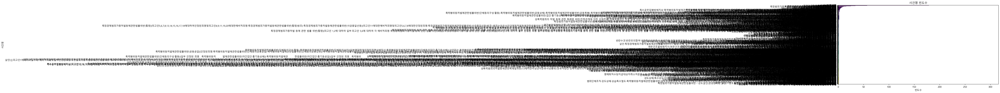

In [16]:
from matplotlib import pyplot as plt
import seaborn as sns

count_data = df['사건명'].value_counts().reset_index()
count_data.columns = ['사건명', '빈도수']  # 열 이름 변경

# 시각화 설정
plt.figure(figsize=(12, 6))
sns.barplot(x='빈도수', y='사건명', data=count_data, palette='viridis', hue='사건명', legend=False)

# 그래프 제목 및 레이블 설정
plt.title('사건명 빈도수')
plt.xlabel('빈도수')
plt.ylabel('사건명')

# 그래프 표시
plt.show()

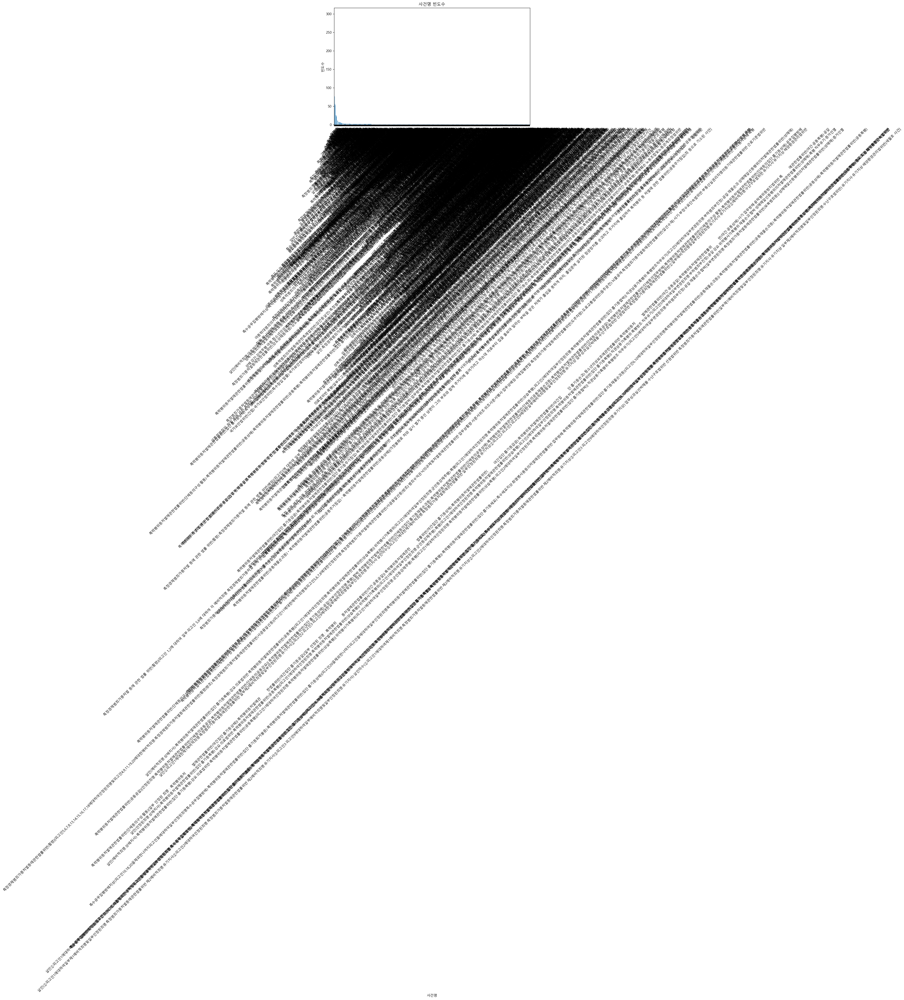

In [17]:
plt.figure(figsize=(10, 6))
df['사건명'].value_counts().plot(kind='bar')
plt.title('사건명 빈도수')
plt.xlabel('사건명')
plt.ylabel('빈도수')
plt.xticks(rotation=45)
plt.show()

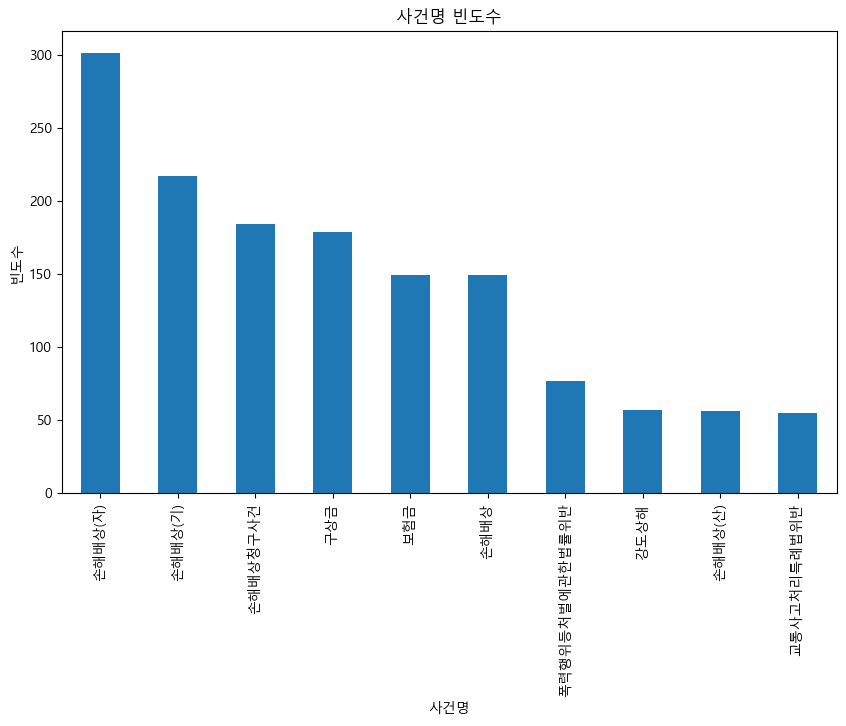

In [18]:
plt.figure(figsize=(10, 6))
df['사건명'].value_counts().head(10).plot(kind='bar')
plt.title('사건명 빈도수')
plt.xlabel('사건명')
plt.ylabel('빈도수')
plt.xticks(rotation=90)
plt.show()

In [20]:
filtered_df1=df['사건명'].value_counts()[df['사건명'].value_counts()>=5]

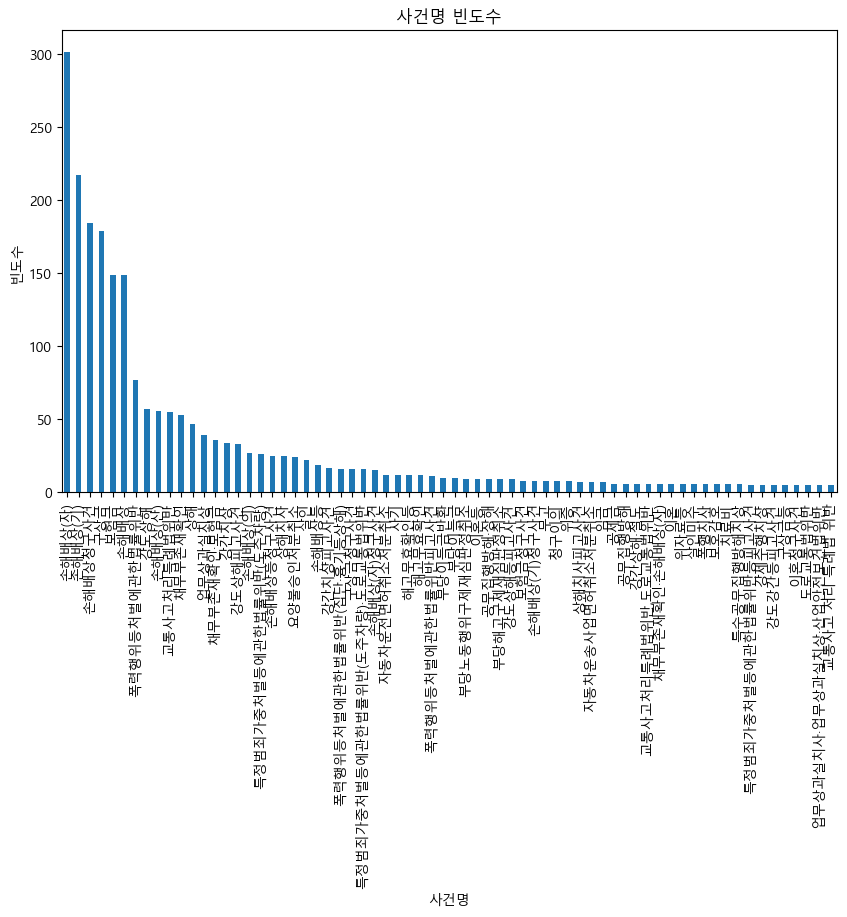

In [21]:
plt.figure(figsize=(10, 6))
filtered_df1.plot(kind='bar')
plt.title('사건명 빈도수')
plt.xlabel('사건명')
plt.ylabel('빈도수')
plt.xticks(rotation=90)
plt.show()

# 법원명

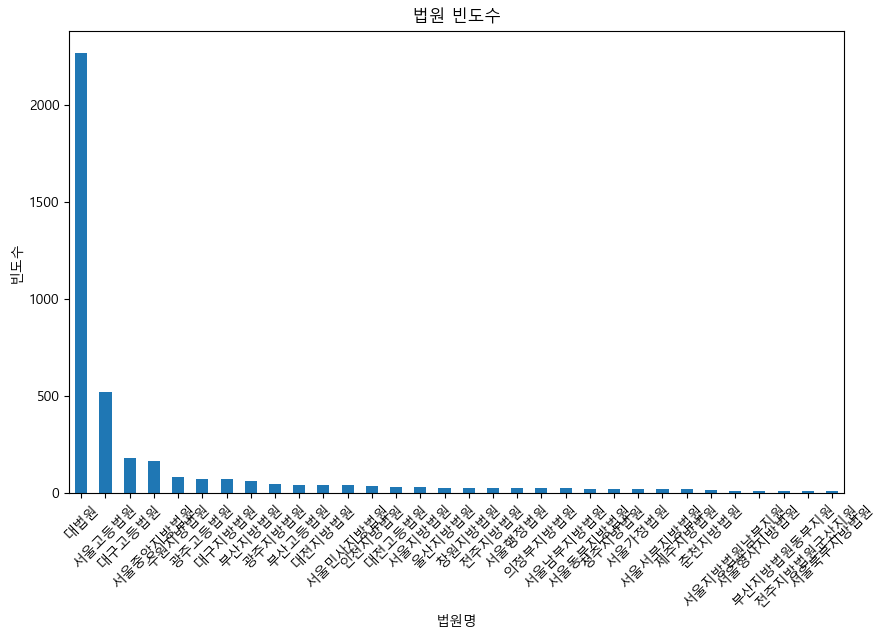

In [22]:
plt.figure(figsize=(10, 6))
df['법원명'].value_counts()[df['법원명'].value_counts()>10].plot(kind='bar')
plt.title('법원 빈도수')
plt.xlabel('법원명')
plt.ylabel('빈도수')
plt.xticks(rotation=45)
plt.show()

In [24]:
# 새로운 열을 추가하여 카테고리화, 기타의 경우 원래 이름 유지
df['법원_카테고리'] = df['법원명'].apply(
    lambda x: '지방법원' if '지방법원' in x else 
              '고등법원' if '고등법원' in x else 
              '대법원' if '대법원' in x else 
              '군사법원' if '군사법원' in x else
              '가정법원' if '가정법원' in x else x)
# 결과 확인
print(df['법원_카테고리'].value_counts())

법원_카테고리
대법원       2267
지방법원       992
고등법원       865
서울행정법원      27
가정법원        26
군사법원         9
특허법원         3
Name: count, dtype: int64


In [26]:
import re
# 카테고리 앞의 단어 추출
def extract_prefix(court_name):
    match = re.match(r'(.+?)(지방법원|고등법원|대법원|군사법원|가정법원)', court_name)
    if match:
        return match.group(1)  # 앞에 있는 단어 반환
    return court_name  # 기타의 경우 원래 이름 반환

df['법원_지역'] = df['법원명'].apply(extract_prefix)

# 결과 확인
df['법원_지역'].value_counts()

법원_지역
대법원          2267
서울            593
대구            268
서울중앙          165
광주            141
부산            126
수원            105
대전             97
전주             42
인천             40
서울민사           40
창원             33
의정부            29
춘천             29
울산             29
서울행정법원         27
청주             27
서울남부           25
서울동부           23
서울서부           22
제주             20
서울형사           14
서울북부           11
고등              5
마산              4
특허법원            3
제6사단보통          1
해군작전사령부보통       1
제26사단보통         1
제3군사령부보통        1
Name: count, dtype: int64

In [27]:
print(df[df['법원명'].str.contains('대법원')]['법원_지역'].value_counts())
print('ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ지방',
      df[df['법원명'].str.contains('지방법원')]['법원_지역'].value_counts())
print('ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ고등',
      df[df['법원명'].str.contains('고등법원')]['법원_지역'].value_counts())
print('ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ군사',
      df[df['법원명'].str.contains('군사법원')]['법원_지역'].value_counts())
print('ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ가정',
      df[df['법원명'].str.contains('가정법원')]['법원_지역'].value_counts())

법원_지역
대법원    2267
Name: count, dtype: int64
ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ지방 법원_지역
서울중앙    165
수원      104
대구       83
부산       76
광주       64
대전       62
서울       50
전주       42
서울민사     40
인천       40
창원       33
울산       29
의정부      29
춘천       29
청주       27
서울남부     25
서울동부     23
서울서부     22
제주       20
서울형사     14
서울북부     11
마산        4
Name: count, dtype: int64
ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ고등 법원_지역
서울    521
대구    183
광주     77
부산     48
대전     35
수원      1
Name: count, dtype: int64
ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ군사 법원_지역
고등           5
제3군사령부보통     1
제6사단보통       1
해군작전사령부보통    1
제26사단보통      1
Name: count, dtype: int64
ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ가정 법원_지역
서울    22
대구     2
부산     2
Name: count, dtype: int64


# 사건종류명

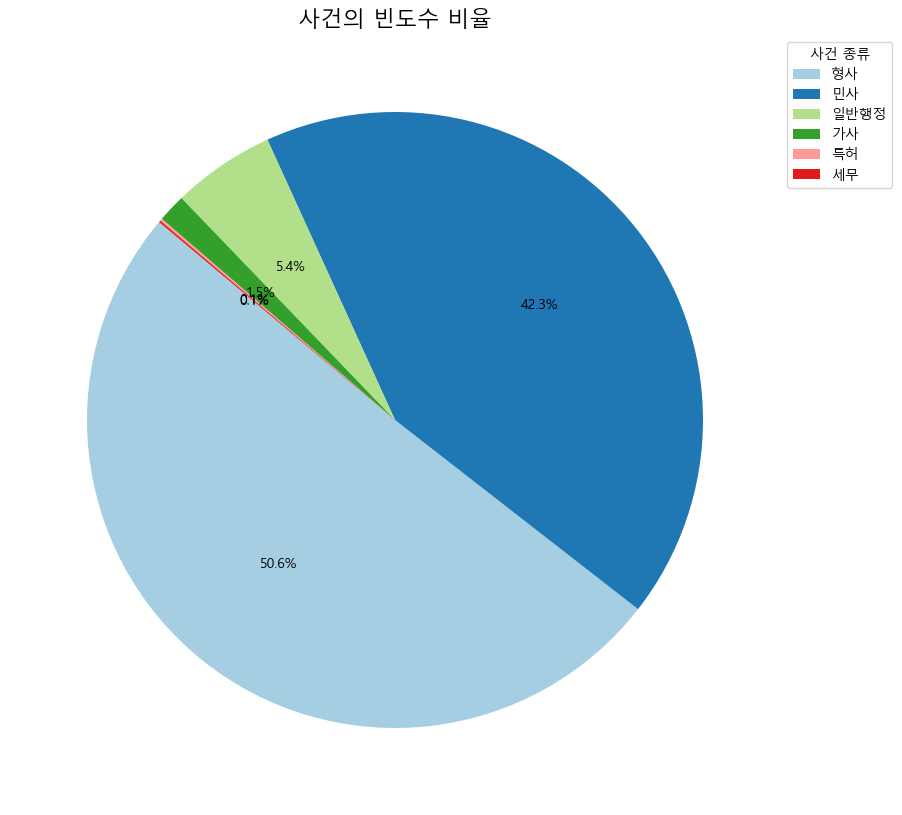

In [35]:
counts = df['사건종류명'].value_counts()

plt.figure(figsize=(10, 10))
# 파이 차트 생성 (라벨은 None으로 설정)
wedges, _, _ = plt.pie(counts, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.title('사건의 빈도수 비율', fontsize=16)
plt.legend(wedges, counts.index, title="사건 종류", loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

# 선고

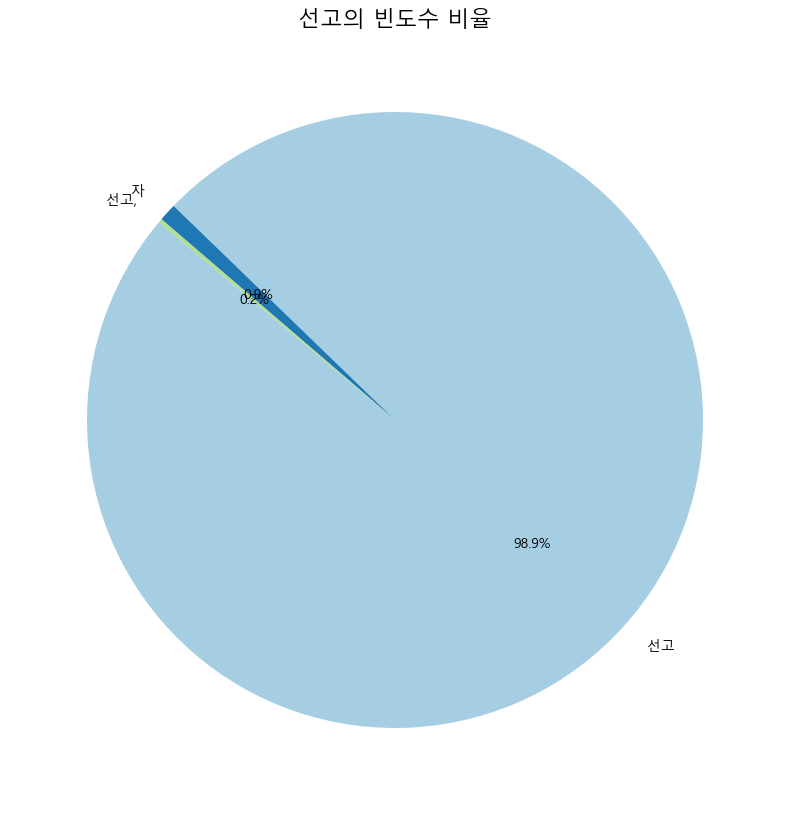

In [36]:
plt.figure(figsize=(10, 10))
plt.pie(df['선고'].value_counts(), labels=df['선고'].value_counts().index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.title('선고의 빈도수 비율', fontsize=16)
plt.show()

In [37]:
df['선고'].value_counts()

선고
선고     4142
자        39
선고,       8
Name: count, dtype: int64

# 판결유형

In [38]:
df['판결유형'].value_counts()

판결유형
판결              2979
판결 : 항소          114
판결 : 확정          105
판결 : 상고           70
판결：확정             53
                ... 
제5부판결 : 항소         1
제4부판결 : 상고기각       1
제36부판결 : 항소        1
제41부판결 : 항소        1
가사부판결 : 확정         1
Name: count, Length: 196, dtype: int64

In [39]:
df['판결유형'][df['판결유형'].str.contains('확정', na=False)].value_counts()
# df['판결유형'][df['판결유형']=='*확정'].value_counts()

판결유형
판결 : 확정         105
판결：확정            53
형사부판결 : 확정       46
제1형사부판결 : 확정     36
제2민사부판결 : 확정     31
               ... 
제3형사부결정 : 확정      1
가사부판결 : 확정        1
제2가사부심판 : 확정      1
제36부판결 : 확정       1
제37부판결 : 확정       1
Name: count, Length: 62, dtype: int64

In [42]:
filtered_counts = df['판결유형'][~df['판결유형'].str.contains('확정|상고|항소|결정|판결', na=False)].value_counts()
filtered_counts

판결유형
판결                2979
전원합의체 판결            36
전원합의체판결              2
판결 : 파기환송            1
심판                   1
판결：심리불속행 기각          1
제42부판결 : 소취하         1
제3민사부 판결 :           1
제1민사부판결 : 파기환송       1
제2민사부판결 :            1
제3부 판결               1
Name: count, dtype: int64

In [44]:
def categorize_판결유형(row):
    if '확정' in row:
        return '확정'
    elif '상고' in row:
        return '상고'
    elif '항소' in row:
        return '항소'
    elif '결정' in row:
        return '결정'
    elif '판결' in row:
        return '판결'
    return row

# 판결유형 열에 함수 적용
df['카테고리'] = df['판결유형'].apply(categorize_판결유형)

# 각 카테고리의 빈도수 계산
value_counts = df['카테고리'].value_counts()

# 결과 출력
print(value_counts)

카테고리
판결    3024
확정     551
상고     348
항소     240
결정      25
심판       1
Name: count, dtype: int64


# 참조조문

In [45]:
df['참조조문'].value_counts()

참조조문
민법 제750조<br/>                                                                                                                                                                                                                                                                                                                                              79
민법 제763조<br/>                                                                                                                                                                                                                                                                                                                                              68
자동차손해배상보장법 제3조<br/>                                                                                                                                                                                                                                                                                    

In [49]:
law_names

{'가사소송법',
 '같은법',
 '같은법시행규칙',
 '같은법시행령',
 '거래신고에 관한 법률',
 '건널목개량촉진법',
 '건설기술관리법',
 '건설기술관리법시행령',
 '건설산업기본법',
 '건설산업기본법시행령',
 '건설업법',
 '건설업법시행령',
 '건축법',
 '건축법시행령',
 '검사규칙',
 '검찰집행사무규칙',
 '검찰청법',
 '게임산업진흥에 관한 법률',
 '경범죄처벌법',
 '경비업법',
 '경찰공무원법',
 '경찰관직무집행법',
 '경찰범처벌규칙',
 '고압가스안전관리법',
 '공동주택관리법',
 '공무원및사립학교교직원의료보험법',
 '공무원연금법',
 '공정거래에 관한 법률',
 '공직선거및선거부정방지법',
 '공직선거법',
 '관광진흥법',
 '관리에 관한 법률',
 '관세법',
 '광업법',
 '교육공무원법',
 '교육기본법',
 '교육법',
 '교통사고처리특례법',
 '구국가배상법',
 '구조개선에 관한 법률',
 '국가공무원법',
 '국가배상법',
 '국가배상법시행령',
 '국가보상법',
 '국가보안법',
 '국가소송법',
 '국가유공자등예우및지원에관한법률시행령',
 '국가재정법',
 '국민건강보험법',
 '국민의료보험법',
 '국민체육진흥법',
 '국바배상법',
 '국유철도건설규칙',
 '국유철도운전규칙',
 '국적법',
 '국제사법',
 '국회의원선거법',
 '군법회의법',
 '군사법원법',
 '군사원호보상급여금법',
 '군사원호보상법',
 '군수품관리법',
 '군수품관리법시행령',
 '군인사법',
 '군인연금법',
 '군형법',
 '귀속재산처리법',
 '규제에 관한 법률',
 '근로기준법',
 '근로기준법시행령',
 '근로복지기본법',
 '기본법',
 '난민법',
 '노동관계조정법',
 '노동위원회법',
 '노동쟁의조정법',
 '노동조합및노동관계조정법',
 '노동조합법',
 '노인복지법',
 '농어촌도로정비법',
 '농업협동조합법',
 '농지개혁법',
 '단속법',
 '대책에 관한 법률',
 '도로교통법',
 '도로교통

In [48]:
import re
def extract_laws(text):
    if isinstance(text, str):  # 텍스트가 문자열인지 확인
    # '법' 또는 '시행령'으로 끝나는 단어를 정규 표현식으로 추출
        laws = re.findall(r'\b(\w+(?:법|시행령|에 관한 법률|규칙))\b', text)
        return set(laws)
    return set()

# 각 참조조문에서 법과 시행령 이름을 찾기
law_names = set()
for reference in df['참조조문']:
    law_names.update(extract_laws(reference))


# 법과 시행령 이름을 붙이는 함수
def add_law_prefix(x):
    if isinstance(x, str):  # 텍스트가 문자열인지 확인
        previous_law = None  # 이전 법 이름 또는 시행령 이름 저장
        new_references = []

        # 참조 조문을 조각으로 나누기
        for part in x.split(','):
            part = part.strip()
            part = re.sub(r'[\[\]［］].*?[\]\］]', '', part)  # 대괄호와 그 안의 내용 제거
            part = re.sub(r'\s*[가-힣]\.\s*', '', part)  # '가.', '나.', '다.'와 같은 패턴 제거
            part = part.strip('<br/>')  # 공백 제거
            part = part.replace('/', ',')  # '/'를 ','로 변경
            part = re.sub(r'\s+', ' ', part).strip()

            # "항"이 포함된 경우 법 이름이 없으면 넘어감
            if re.search(r'\d+항$', part):
                if not any(law in part for law in law_names):
                    continue  # 법 이름이 붙어 있지 않으면 넘어감

            # "조"로 끝나는 경우 법 이름이 없으면 이전 법 이름 붙이기
            elif re.search(r'\d+조$', part):
                if not any(law in part for law in law_names):
                    part = f"{previous_law} {part}"  # 이전 법 이름 붙이기
                for law_name in law_names:
                    if law_name in part:
                        previous_law = law_name  # 법 이름이 있는 경우 업데이트
                        break

            new_references.append(part)

        return ', '.join(new_references)  # 새로운 참조 조문을 합쳐서 반환
    return x  # 문자열이 아닐 경우 그대로 반환

In [50]:
#기존 데이터 프레임 안건드리고 변환

a = df['참조조문'].apply(add_law_prefix)
a=a.fillna('해당 참조조문 없음')
a

0       구 법인세법(2006. 12. 30. 법률 제8141호로 개정되기 전의 것) 제91...
1                                형법 제257조 제1항, None 제284조
2       헌법 제12조, 형사소송법 제33조 제1항 제1호, 헌법 제69조, 헌법 제475조...
3       형사소송법 제294조의2 제1항, 형사소송규칙 제134조의10 제1항, 제134조의...
4       헌법 제13조 제1항, 형의 집행 및 수용자의 처우에 관한 법률 제107조, 처우에...
                              ...                        
4184                                             형법 제161조
4185                                          형사소송법 제311조
4186                    형사소송법 제307조, 형사소송법 제308조, 형법 제10조
4187                                           해당 참조조문 없음
4188    None 조치령 제1조, None 제4조, 제4조 3호, 형사소송법 제516조, 형...
Name: 참조조문, Length: 4189, dtype: object

In [51]:
a.fillna('해당 참조조문 없음')

0       구 법인세법(2006. 12. 30. 법률 제8141호로 개정되기 전의 것) 제91...
1                                형법 제257조 제1항, None 제284조
2       헌법 제12조, 형사소송법 제33조 제1항 제1호, 헌법 제69조, 헌법 제475조...
3       형사소송법 제294조의2 제1항, 형사소송규칙 제134조의10 제1항, 제134조의...
4       헌법 제13조 제1항, 형의 집행 및 수용자의 처우에 관한 법률 제107조, 처우에...
                              ...                        
4184                                             형법 제161조
4185                                          형사소송법 제311조
4186                    형사소송법 제307조, 형사소송법 제308조, 형법 제10조
4187                                           해당 참조조문 없음
4188    None 조치령 제1조, None 제4조, 제4조 3호, 형사소송법 제516조, 형...
Name: 참조조문, Length: 4189, dtype: object

In [52]:
# Pandas 설정 변경
pd.set_option('display.max_rows', None)  # 모든 행 출력
pd.set_option('display.max_columns', None)  # 모든 열 출력

In [53]:
df['참조조문'][df['참조조문'].str.contains('같은법',na=False)].index

Index([ 946, 2924, 2938, 2984, 3004, 3021, 3025, 3045, 3060, 3096, 3108, 3111,
       3125, 3165, 3194, 3210],
      dtype='int64')

In [54]:
# 법 이름을 붙이는 함수
def add_law_prefix(x):
    if isinstance(x, str):  # 텍스트가 문자열인지 확인
        previous_law = None  # 이전 법 이름 저장
        new_references = []

        # 참조 조문을 조각으로 나누기
        for part in x.split(','):
            part = part.strip()  # 공백 제거
            if previous_law and not any(law in part for law in law_names):
                # 법 이름이 없는 경우, 이전 법 이름을 붙이기
                part = f"{previous_law} {part}"
            new_references.append(part)

            # 법 이름을 확인하여 업데이트
            for law_name in law_names:
                if law_name in part:
                    previous_law = law_name  # 이전 법 이름 업데이트

        return ', '.join(new_references)  # 새로운 참조 조문을 합쳐서 반환
    return x  # 문자열이 아닐 경우 그대로 반환

# 참조판례

In [55]:
df['참조판례']=df['참조판례'].fillna('참조판례 없음')

In [56]:
print(df['참조판례'])

0        [3] 대법원 1994. 8. 12. 선고 92누12094 판결(공1994하, 2...
1       대법원 2002. 6. 14. 선고 2002도1341 판결, 대법원 2004. 6....
2       대법원 2009. 5. 28. 선고 2009도579 판결(공2009하, 1060)(...
3                                                 참조판례 없음
4       대법원 2000. 10. 27. 선고 2000도3874 판결(공2000하, 2487...
5                  대법원 2006. 11. 23. 선고 2006도5407 판결<br/>
6       대법원 2011. 10. 27. 선고 2009도9948 판결, 대법원 2012. 9...
7                                                 참조판례 없음
8                                                 참조판례 없음
9                                                 참조판례 없음
10                                                참조판례 없음
11       [1] 대법원 1985. 6. 11. 선고 85도926 판결(공1985, 1038...
12                                                참조판례 없음
13       [1] 대법원 2017. 10. 26. 선고 2016다239536 판결, 대법원 ...
14       [1] 대법원 1997. 3. 20. 선고 96도1167 전원합의체 판결(공199...
15                                                참조판례 없음
16                                                참조판례 없음
17            

In [57]:
#참조판례 정리

clean_part=[]
for part in df['참조판례']:
    part = part.strip()
    part = re.sub(r'[\[\]［］].*?[\]\］]', '', part)  # 대괄호와 그 안의 내용 제거
    part = re.sub(r'\s*[가-힣]\.\s*', '', part)  # '가.', '나.', '다.'와 같은 패턴 제거
    part = part.strip('<br/>')  # 공백 제거
    part = part.replace('/', ',')  # '/'를 ','로 변경
    part = re.sub(r'\s+', ' ', part).strip()
    clean_part.append(part)

df['참조판례']=clean_part

In [58]:
refered_jud=[]
for clean_part in df['참조판례']:
    parts = re.split(r',\s*(?![^()]*\))', clean_part)
    for sub in parts:
        refered_jud.append(sub)

refered_jud = [item for item in refered_jud if item.strip()]
refered_jud

['대법원 1994. 8. 12. 선고 92누12094 판결(공1994하, 2312)',
 '대법원 2021. 2. 25. 선고 2017두237 판결',
 '대법원 2024. 4. 12. 선고 2023두58701 판결(공2024상, 800)',
 '대법원 2002. 6. 14. 선고 2002도1341 판결',
 '대법원 2004. 6. 11. 선고 2004도2018 판결(공2004하, 1198)',
 '대법원 2017. 3. 30. 선고 2017도771 판결',
 '대법원 2009. 5. 28. 선고 2009도579 판결(공2009하, 1060)(변경)',
 '대법원 2011. 9. 29. 선고 2011도10441 판결(변경)',
 '대법원 2011. 11. 10. 선고 2011도12108 판결(변경)',
 '대법원 2012. 6. 28. 선고 2012도5420 판결(변경)',
 '대법원 2016. 6. 9. 선고 2016도4479 판결(변경)',
 '대법원 2017. 1. 12. 선고 2016도19006 판결(변경)',
 '참조판례 없음',
 '대법원 2000. 10. 27. 선고 2000도3874 판결(공2000하, 2487)',
 '대법원 2006. 11. 23. 선고 2006도5407 판결',
 '대법원 2011. 10. 27. 선고 2009도9948 판결',
 '대법원 2012. 9. 27. 선고 2012도9295 판결(공2012하, 1799)',
 '대법원 2019. 6. 20. 선고 2018도20698 전원합의체 판결(공2019하, 1485)',
 '참조판례 없음',
 '참조판례 없음',
 '참조판례 없음',
 '참조판례 없음',
 '대법원 1985. 6. 11. 선고 85도926 판결(공1985, 1038)',
 '대법원 1999. 6. 11. 선고 99도763 판결(공1999하, 1454)',
 '대법원 2003. 6. 13. 선고 2003도924 판결(공2003하, 1566)',
 '대법원 2016. 2. 19. 선고 2015도12980 전원

In [59]:
refjud=pd.DataFrame(data=refered_jud)
print(refjud.value_counts())
refjud.describe()

0                                                                                            
참조판례 없음                                                                                          2264
>                                                                                                  25
<br                                                                                                18
대법원 2000. 7. 4. 선고 99도4341 판결(공2000하, 1851)                                                         9
대법원 1994. 9. 13. 선고 94도1335 판결(공1994하, 2695)                                                        8
대법원 2002. 6. 28. 선고 2002도2001 판결(공2002하, 1893)                                                      8
대법원 1996. 4. 9. 선고 96도252 판결(공1996상, 1481)                                                          7
대법원 1994. 3. 22. 선고 93도3612 판결(공1994상, 1373)                                                        7
대법원 1988. 4. 27. 선고 87다카74 판결(공1988, 900)                                                 

,0
count,8520
unique,5080
top,참조판례 없음
freq,2264


In [60]:
refjud_fre = refjud.value_counts().reset_index()
refjud_fre.columns=['참조판례','빈도수']
top10refjud=refjud_fre.head(10)
filterd_refjud=refjud_fre[refjud_fre['참조판례']!='참조판례 없음']
top10filterd_refjud=filterd_refjud.head(10)

In [61]:
top10filterd_refjud

,참조판례,빈도수
1,>,25
2,<br,18
3,"대법원 2000. 7. 4. 선고 99도4341 판결(공2000하, 1851)",9
4,"대법원 1994. 9. 13. 선고 94도1335 판결(공1994하, 2695)",8
5,"대법원 2002. 6. 28. 선고 2002도2001 판결(공2002하, 1893)",8
6,"대법원 1996. 4. 9. 선고 96도252 판결(공1996상, 1481)",7
7,"대법원 1994. 3. 22. 선고 93도3612 판결(공1994상, 1373)",7
8,"대법원 1988. 4. 27. 선고 87다카74 판결(공1988, 900)",7
9,"대법원 2001. 3. 9. 선고 2000도5590 판결(공2001상, 910)",6
10,"대법원 1994. 3. 22. 선고 93도2080 전원합의체 판결(공1994상, 1...",6


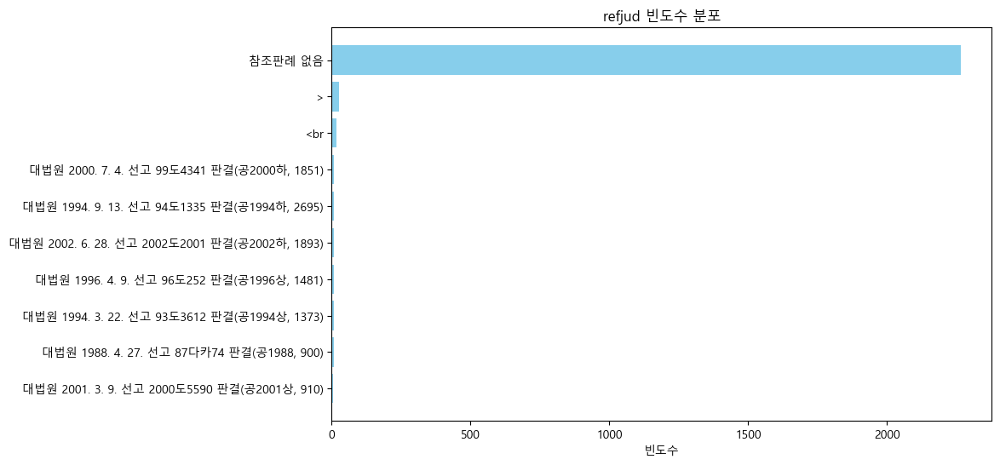

In [62]:
import matplotlib.pyplot as plt

# top10 빈도수 시각화
plt.figure(figsize=(10, 6))
plt.barh(top10refjud['참조판례'], top10refjud['빈도수'], color='skyblue')
plt.xlabel('빈도수')
plt.title('refjud 빈도수 분포')
plt.gca().invert_yaxis()  # y축 반전
plt.show()

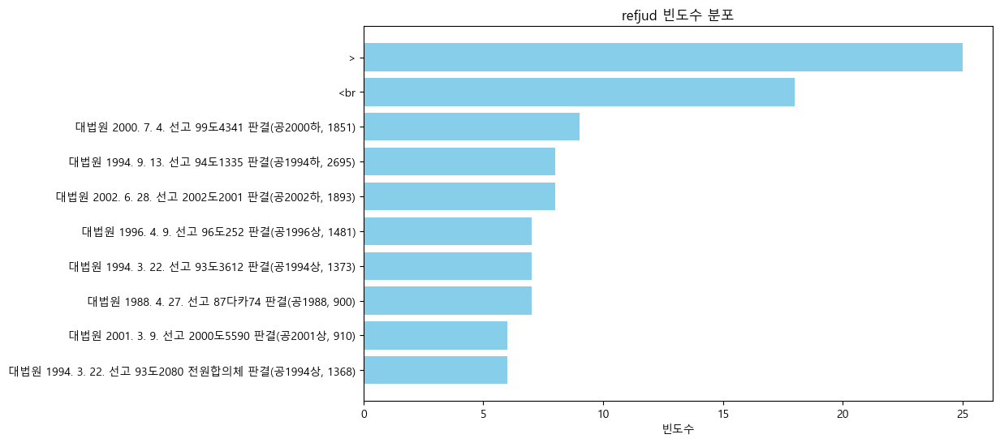

In [63]:
# top10 빈도수(참조판례 없음 제외) 시각화
plt.figure(figsize=(10, 6))
plt.barh(top10filterd_refjud['참조판례'], top10filterd_refjud['빈도수'], color='skyblue')
plt.xlabel('빈도수')
plt.title('refjud 빈도수 분포')
plt.gca().invert_yaxis()  # y축 반전
plt.show()

# 판례내용